In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from test_image import *
from steerable_pyramid import SuboctaveSPR

%matplotlib inline

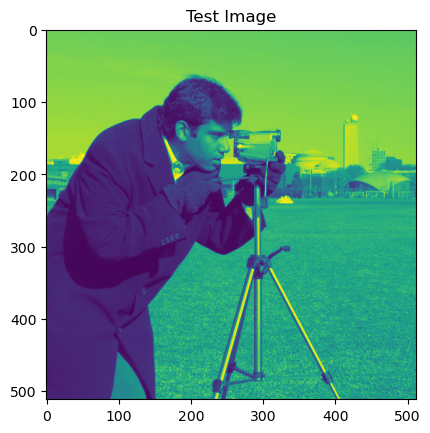

In [2]:
from skimage.data import camera

# image = get_test_image(512, f1)
# image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

image = camera()

plt.imshow(image)
plt.title("Test Image");

In [35]:
s_pyr = SuboctaveSPR(depth=7, nbands=8, filters_per_octave=6, cos_order=6, complex_pyr=True)

In [36]:
# get Steerable Pyramid Filters
filters, crops = s_pyr.get_filters(image)

# get Steerable Pyramid Decomposition
pyramid = s_pyr.build_pyramid(image, filters, crops)

# reconstruct original image DFT from pyramid decomposition
recon_dft = s_pyr.reconstruct_image_dft(pyramid, filters, crops)

## Display Results

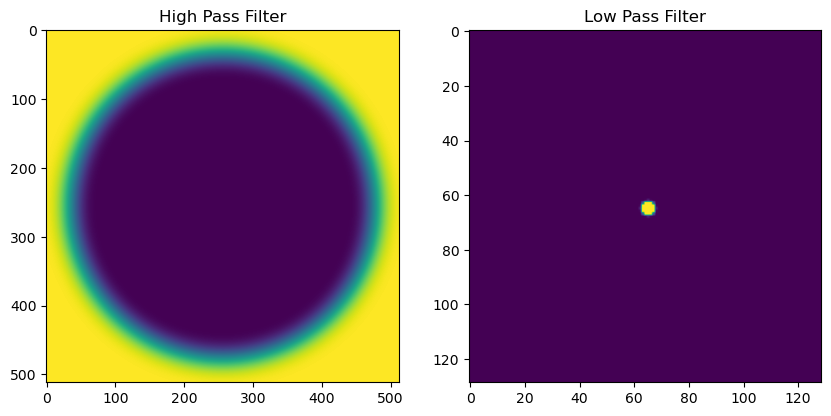

In [38]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(filters[0]);
ax[0].set_title("High Pass Filter");

ax[1].imshow(filters[-1]);
ax[1].set_title("Low Pass Filter");

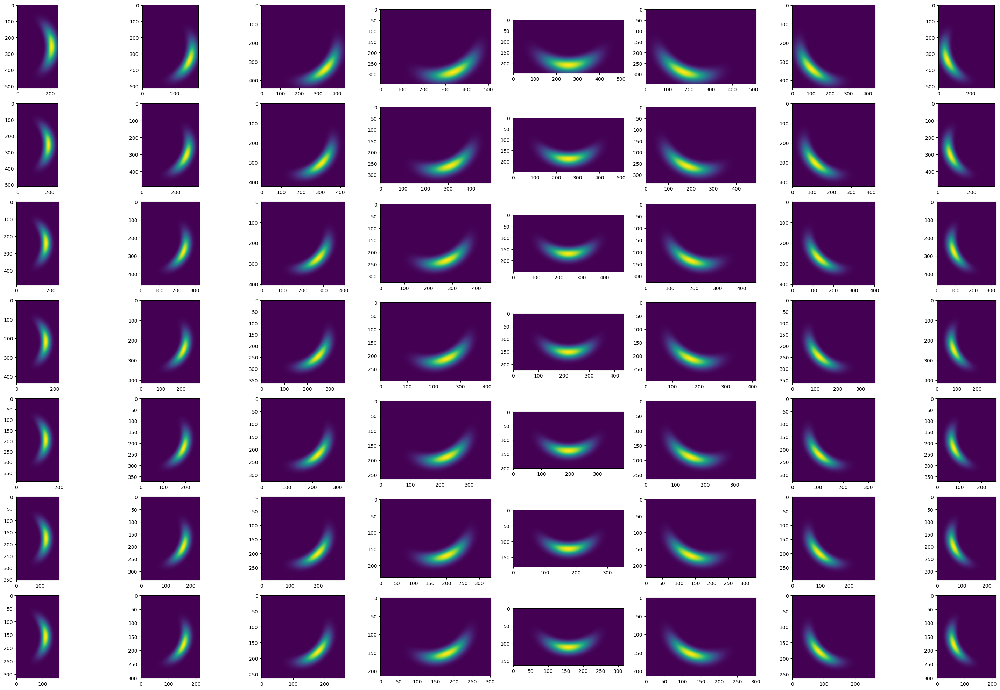

In [39]:
s_pyr.display(filters);

In [40]:
magnitude_pyramid = [np.abs(pyr) for pyr in pyramid]
phase_pyramid = [np.angle(pyr) for pyr in pyramid]

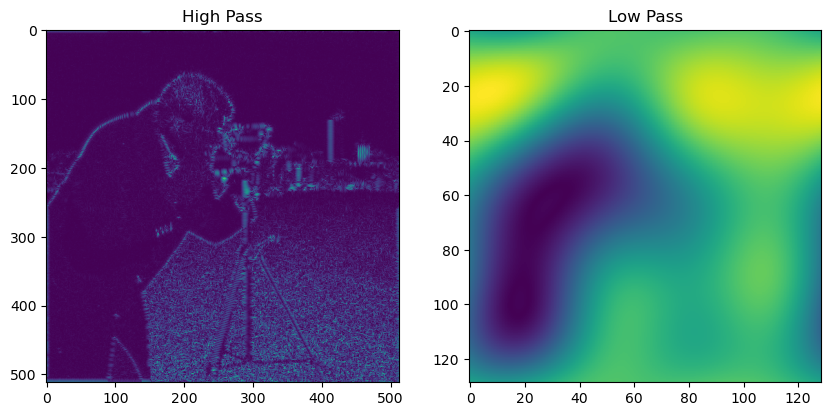

In [41]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.abs(pyramid[0]));
ax[0].set_title("High Pass");

ax[1].imshow(np.abs(pyramid[-1]));
ax[1].set_title("Low Pass");

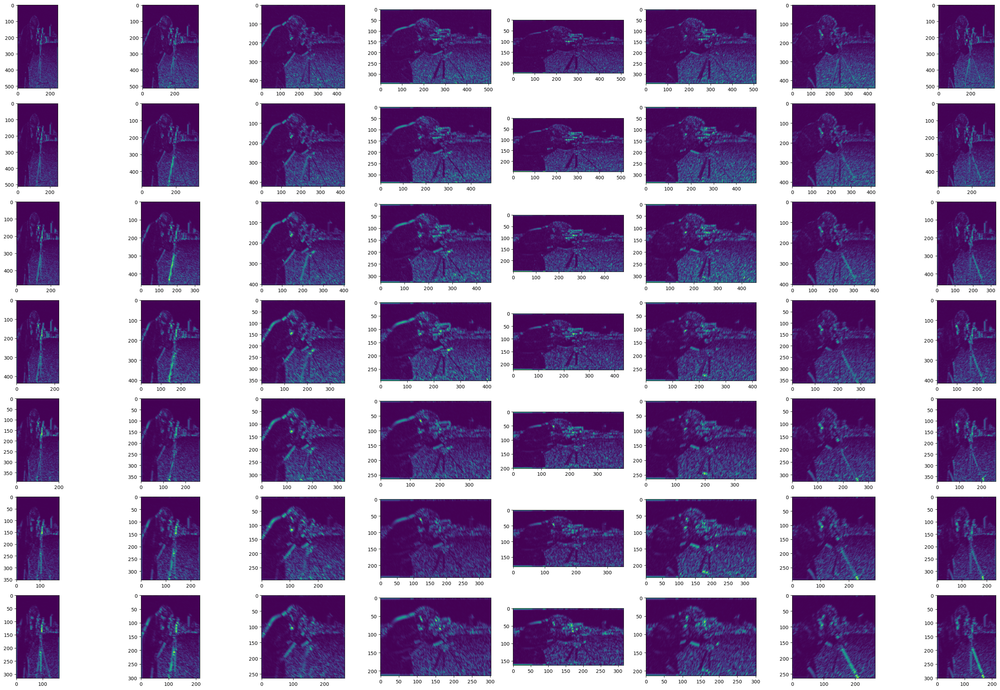

In [42]:
s_pyr.display(magnitude_pyramid);

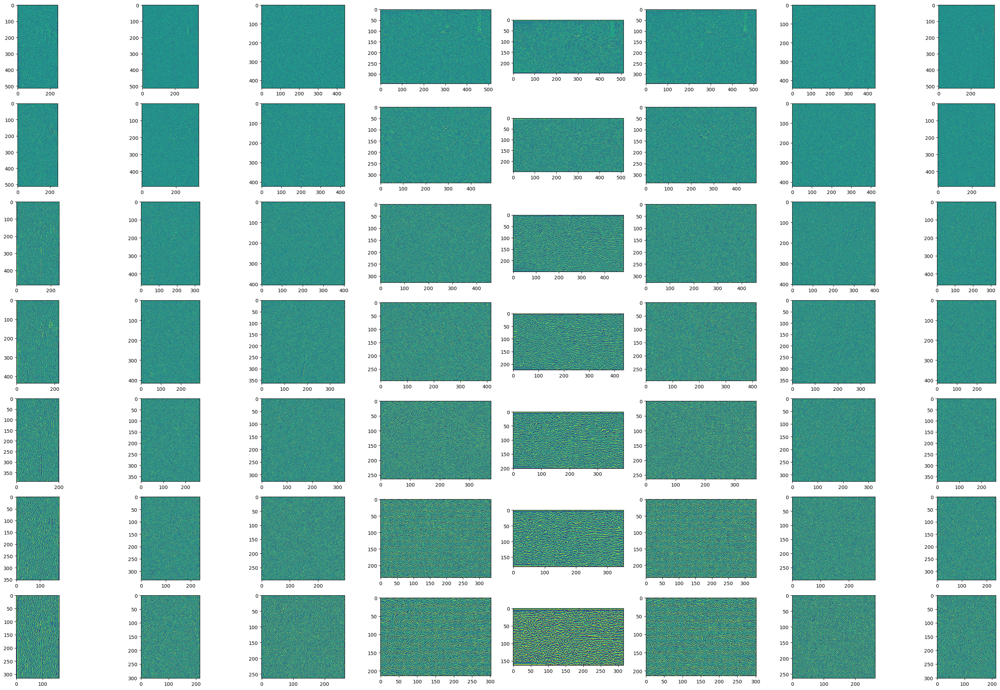

In [43]:
s_pyr.display(phase_pyramid);

In [44]:
image_dft = np.fft.fftshift(np.fft.fft2(image))

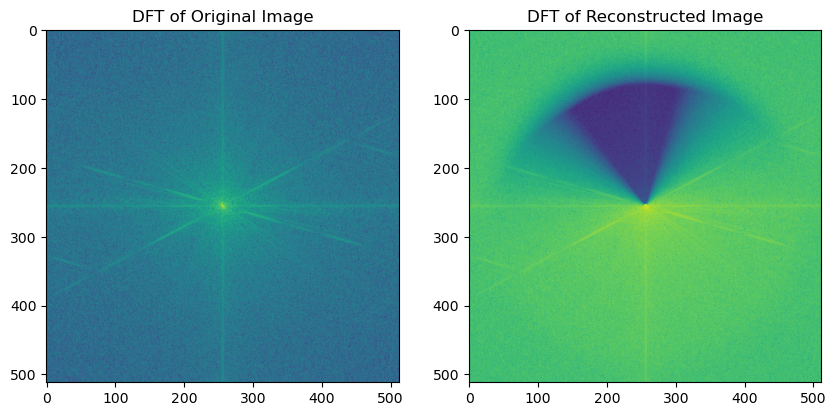

In [45]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.log(np.abs(image_dft)));
ax[0].set_title("DFT of Original Image");

ax[1].imshow(np.log(np.abs(recon_dft)));
ax[1].set_title("DFT of Reconstructed Image");

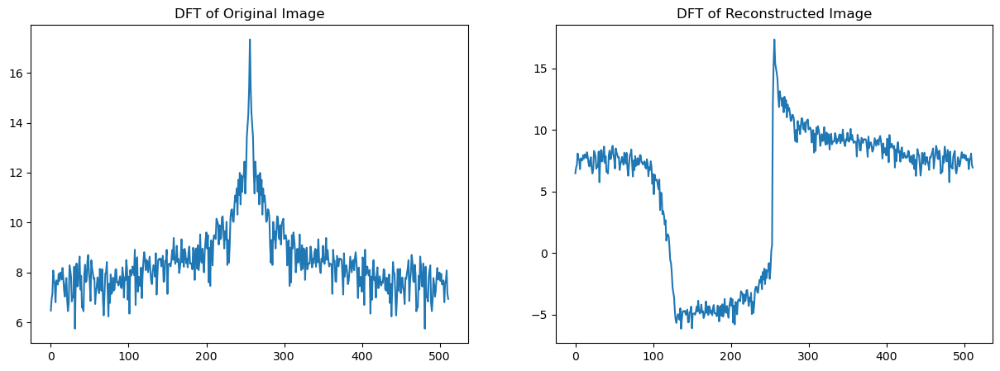

In [46]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.log(np.abs( np.diag(image_dft) )));
ax[0].set_title("DFT of Original Image");

ax[1].plot(np.log(np.abs( np.diag(recon_dft) )));
ax[1].set_title("DFT of Reconstructed Image");

In [47]:
recon = np.fft.ifft2(np.fft.ifftshift(recon_dft)).real

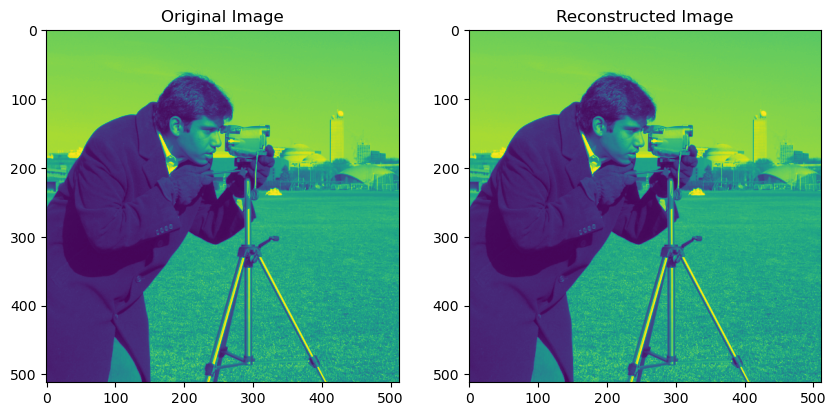

In [48]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(image);
ax[0].set_title("Original Image");

ax[1].imshow(recon);
ax[1].set_title("Reconstructed Image");

In [49]:
np.sum(np.abs(recon - image)), np.mean(np.square(recon - image))

(1501.553551805081, 5.3151220554298566e-05)

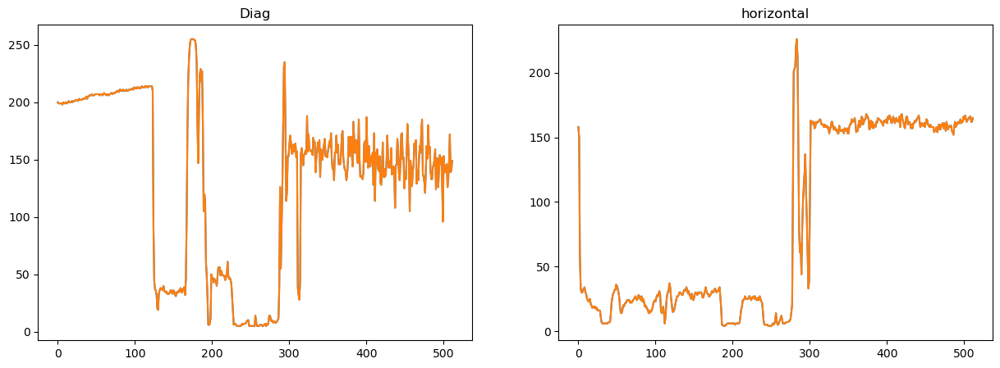

In [50]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.diag(image));
ax[0].plot(np.diag(recon))
ax[0].set_title("Diag");

ax[1].plot(image[256, :]);
ax[1].plot(recon[256, :])
ax[1].set_title("horizontal");